# 中尺度模式逐小时降水个例检验评估

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
import pathlib
from datetime import datetime, timedelta
import numpy as np
import xarray as xr
import matplotlib as mpl
import matplotlib.pyplot as plt
init_time = datetime(2018, 6, 7, 0)
fhours = np.arange(6) + 14
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(113.5, 23.9), width=4)
import cartopy.crs as ccrs
from nmc_met_graphics.plot.china_map import add_china_map_2cartopy
from nmc_met_graphics.cmap.ctables import cm_qpf_nws

In [3]:
# set data file directory
data_dir = pathlib.Path("I:/Level_01/")
cmpas_dir = pathlib.Path("G:/DATA_NC/2018/0P05/")

In [4]:
def model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                     models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                     center=(112, 22), width=4):
    # get default parameters
    map_extend = (center[0]-width, center[0]+width, 
                  center[1]-width, center[1]+width)
    nrows = len(models)+1
    ncols = len(fhours)
    
    # set figure
    datacrs = ccrs.PlateCarree()
    plotcrs = ccrs.PlateCarree(central_longitude=115)
    plt.figure(figsize=(3*ncols,4*nrows))
    gs1 = gridspec.GridSpec(nrows, ncols)
    gs1.update(wspace=0, hspace=0.15)

    # display each subplot
    for i, fhour in enumerate(fhours):
        # set time, like 2018061211, obs and forecast is 10-11
        obs_time = init_time + timedelta((fhour)/24.)
        valid_time = init_time + timedelta((fhour)/24.)
        
        # read obs data file
        file = list(cmpas_dir.glob(
            "*_HOR-PRE-"+obs_time.strftime("%Y%m%d%H")+".rain.nc"))
        DS = xr.open_dataset(file[0])

        # plot figure
        ax = plt.subplot(gs1[0, i], projection=plotcrs)
        ax.set_extent(map_extend, crs=datacrs)
        cmap, norm = cm_qpf_nws(atime=1)
        ds_plt = DS['rain'].isel(time=0).plot(
            ax=ax, transform=datacrs, norm=norm, cmap=cmap)
        ds_plt.colorbar.remove()
        ax.coastlines()
        ax.set_title(valid_time.strftime("CMPAS %d-%H"))  # same as model forecast period
        ax.set_aspect(1.2)

        for j, model in enumerate(models):
            # read model forecast data file
            file = data_dir.joinpath(model,
                init_time.strftime("%Y%m%d%H"),
                model+"_tp_"+init_time.strftime("%Y%m%d%H%M")+"{0}".format(fhour)+".nc")
            if not file.is_file():
                continue
            DS = xr.open_dataset(file)

            # plot figure
            ax = plt.subplot(gs1[j+1, i], projection=plotcrs)
            ax.set_extent(map_extend, crs=datacrs)
            cmap, norm = cm_qpf_nws(atime=1)
            if model == "shanghai9km":
                ds_plt = DS['tp'].isel(time=0, level=0).plot(
                    ax=ax, transform=datacrs, norm=norm, cmap=cmap)
            else:
                ds_plt = DS['tp'].isel(time=0).plot(
                    ax=ax, transform=datacrs, norm=norm, cmap=cmap)
            ds_plt.colorbar.remove()
            ax.coastlines()
            ax.set_title(valid_time.strftime(model+" %d-%H"))
            ax.set_aspect(1.2)

个例分析思考:
- 可以把预报时间段划分为6-18, 18-30, 在6-18h不采用前后时间来做集合预报, 而在18-30h则采用前后1个小时来构建集合，因为这时往往系统偏差占主要地位
- 要进行量的偏差订正，也可以分成6-18, 18-30两个预报时段，也可以尝试逐6小时时段
- 总体上GrapesMeso模式预报能力不足，可以看看RAFS模式，但目前还不宜加入

## 2018年4月14日夜间发生华南地区强降水过程

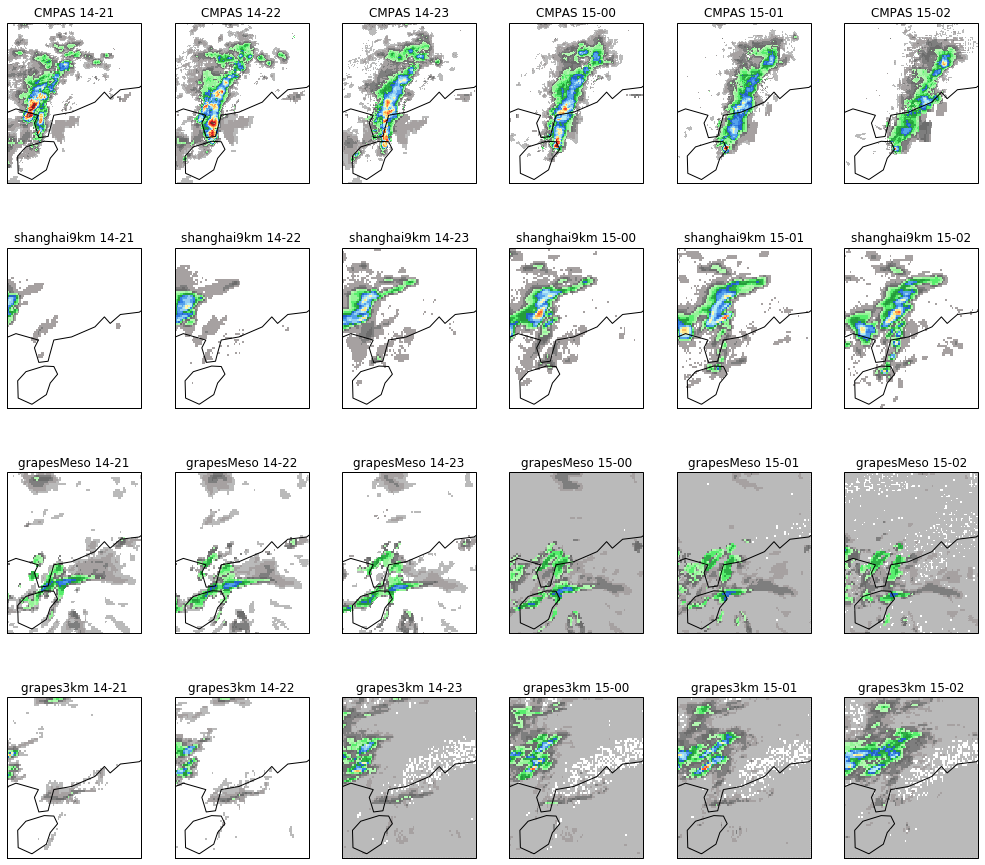

In [5]:
init_time = datetime(2018, 4, 14, 12)
fhours = np.arange(6) + 9
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(112, 22), width=4)

##  2018年4月21日傍晚发生黄淮地区强降水过程

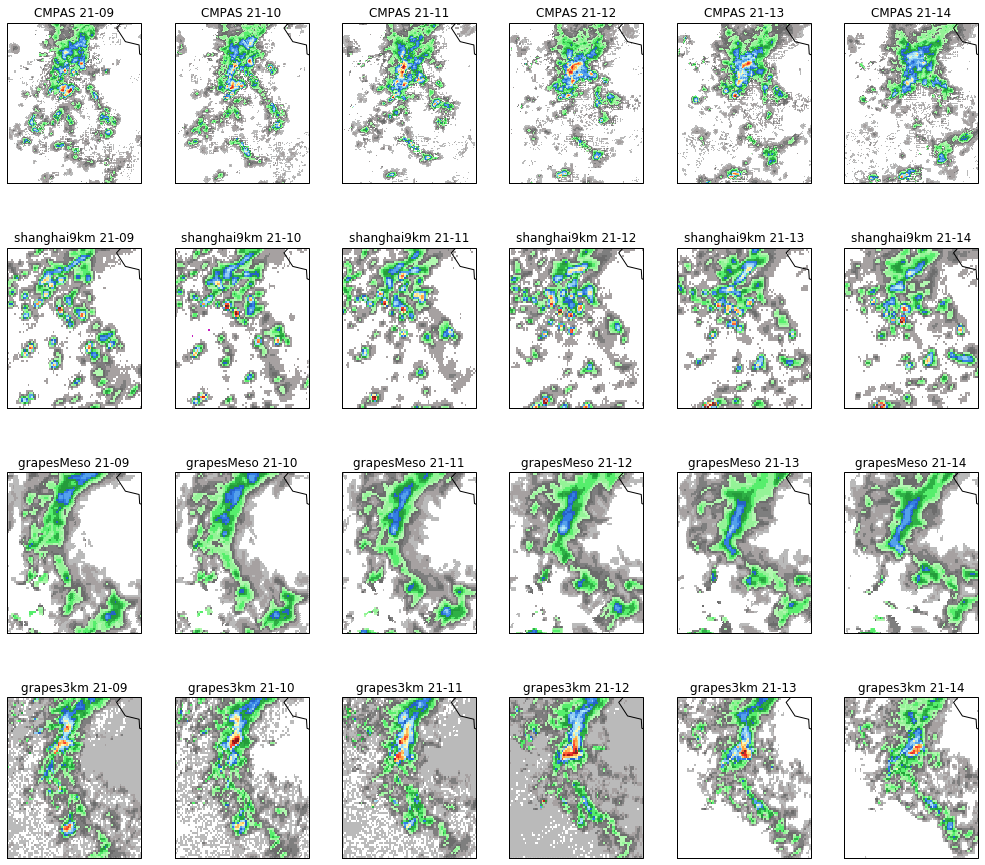

In [6]:
init_time = datetime(2018, 4, 21, 0)
fhours = np.arange(6) + 9
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(115, 35), width=4)

##  2018年4月22日长江中游强降水过程

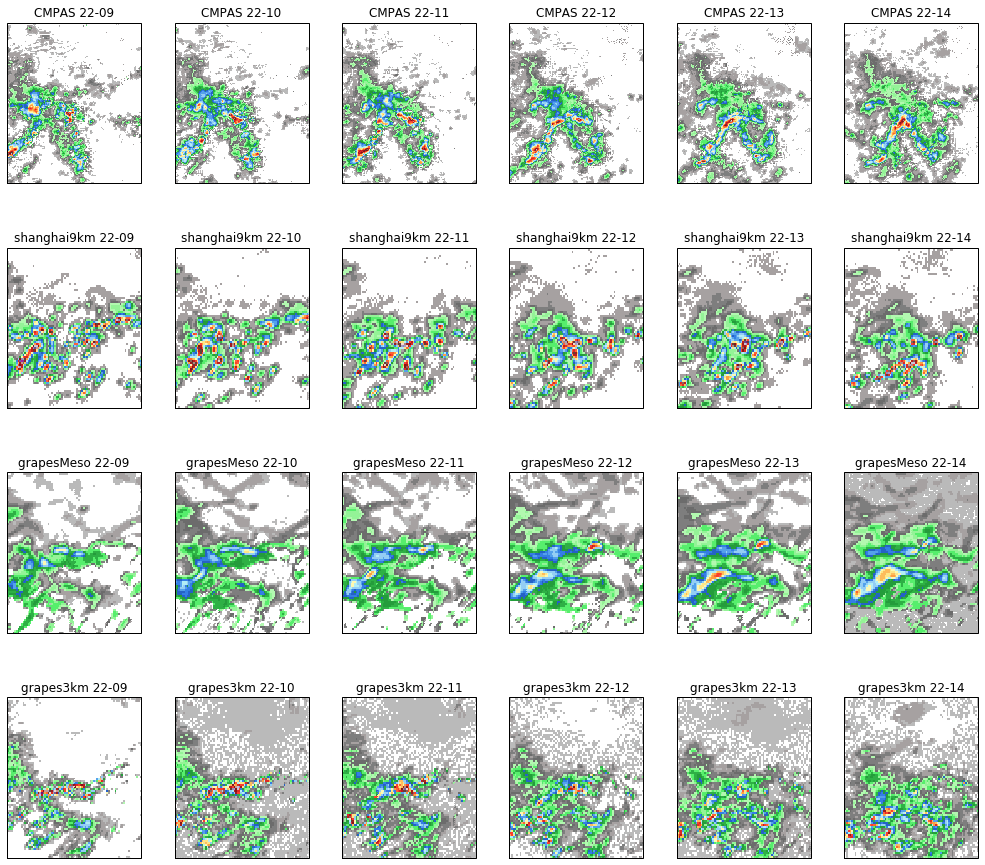

In [7]:
init_time = datetime(2018, 4, 22, 0)
fhours = np.arange(6) + 9
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(114, 30.6), width=4)

##  2018年5月5日长江中游强降水过程

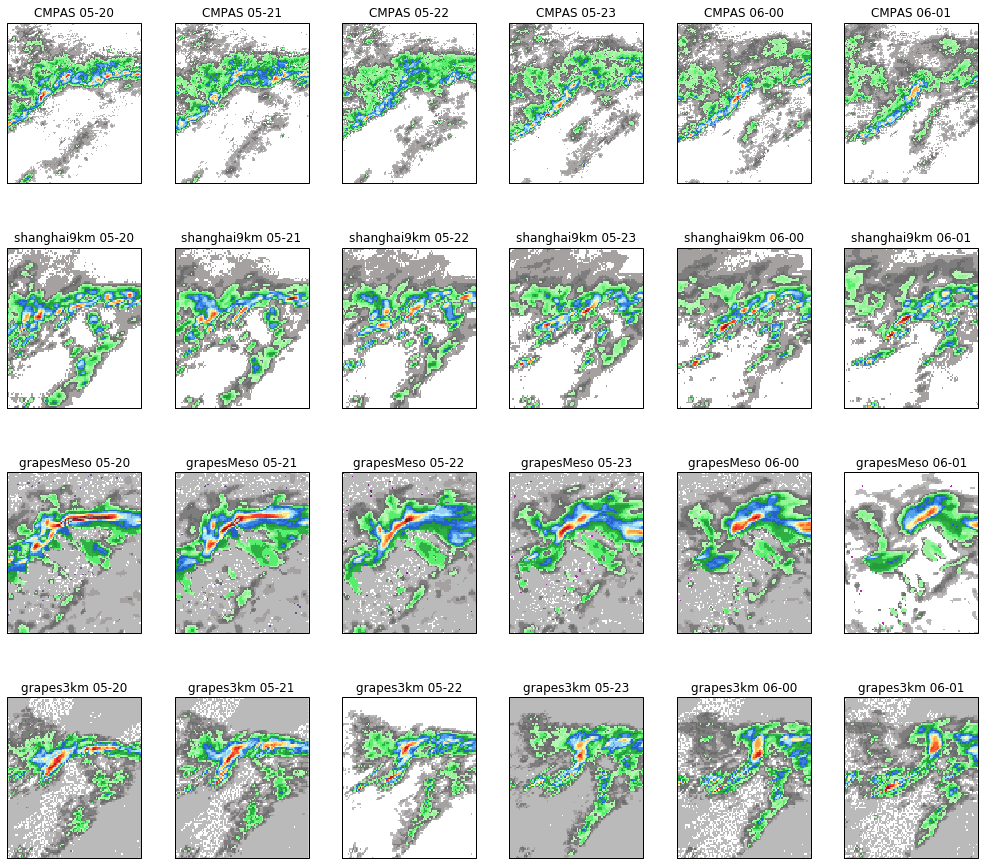

In [8]:
init_time = datetime(2018, 5, 5, 12)
fhours = np.arange(6) + 8
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(114, 30.6), width=5)

##  2018年5月22日西南地区东部强降水过程

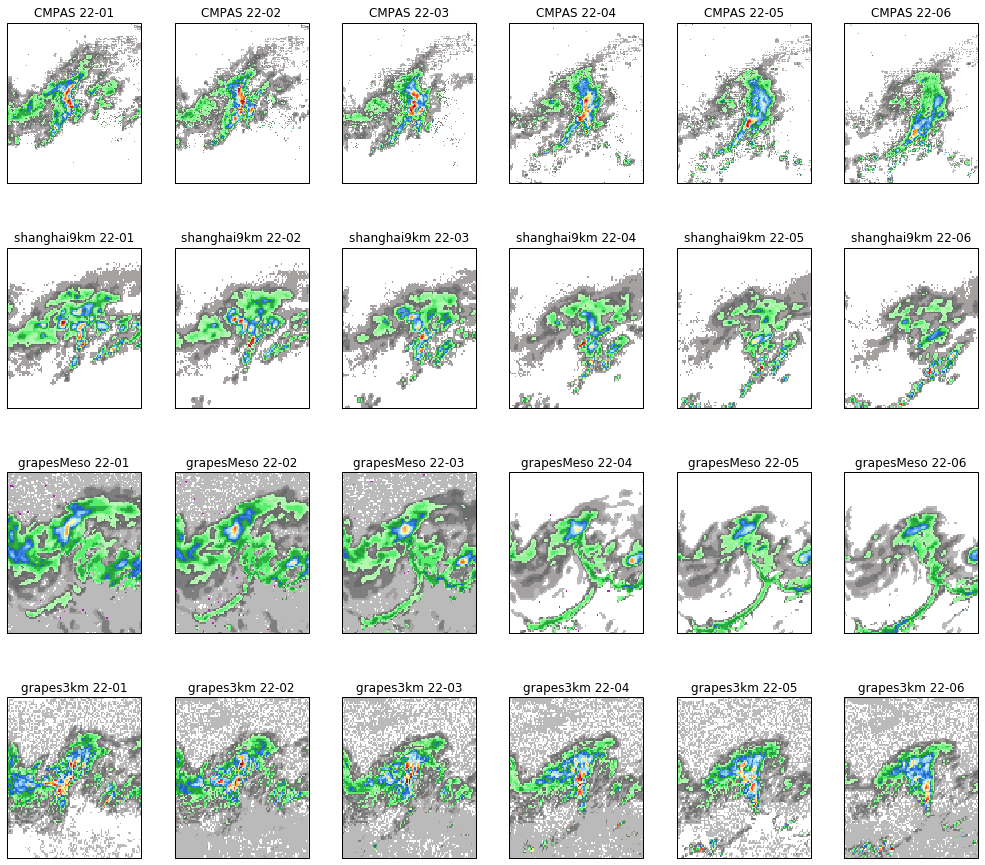

In [9]:
init_time = datetime(2018, 5, 21, 12)
fhours = np.arange(6) + 13
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(108.2, 29.8), width=5)

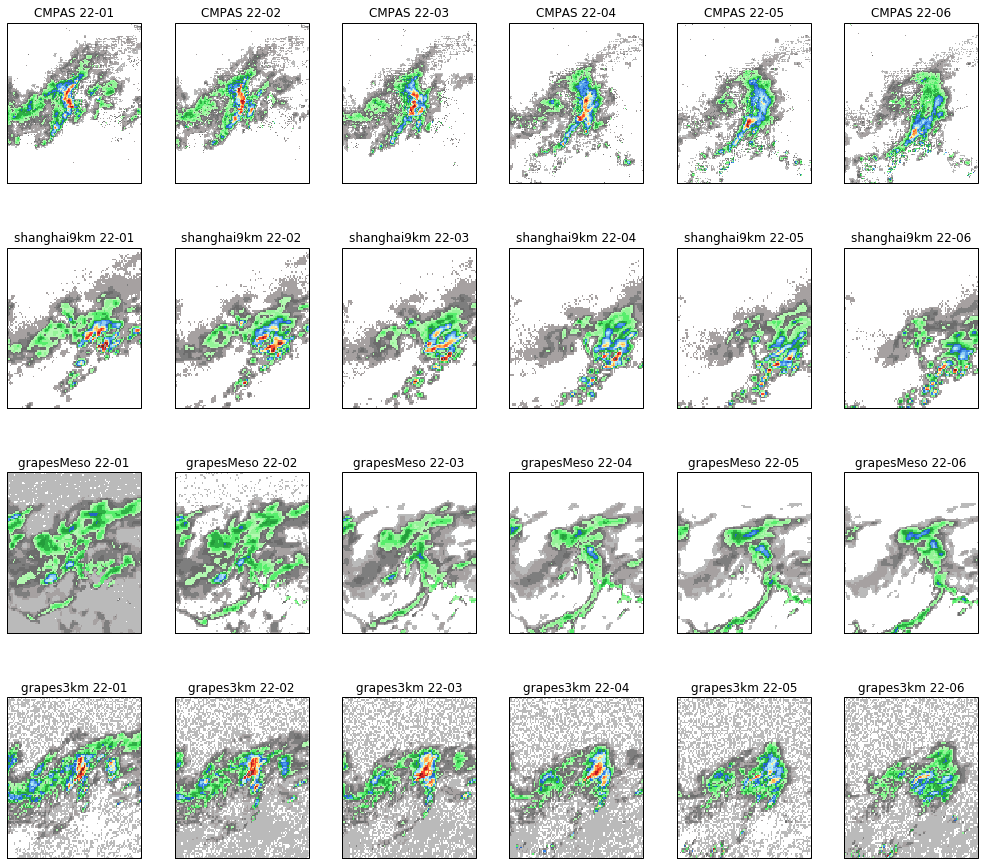

In [10]:
init_time = datetime(2018, 5, 21, 0)
fhours = np.arange(6) + 25
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(108.2, 29.8), width=5)

##  2018年6月5日江南东部强降水过程

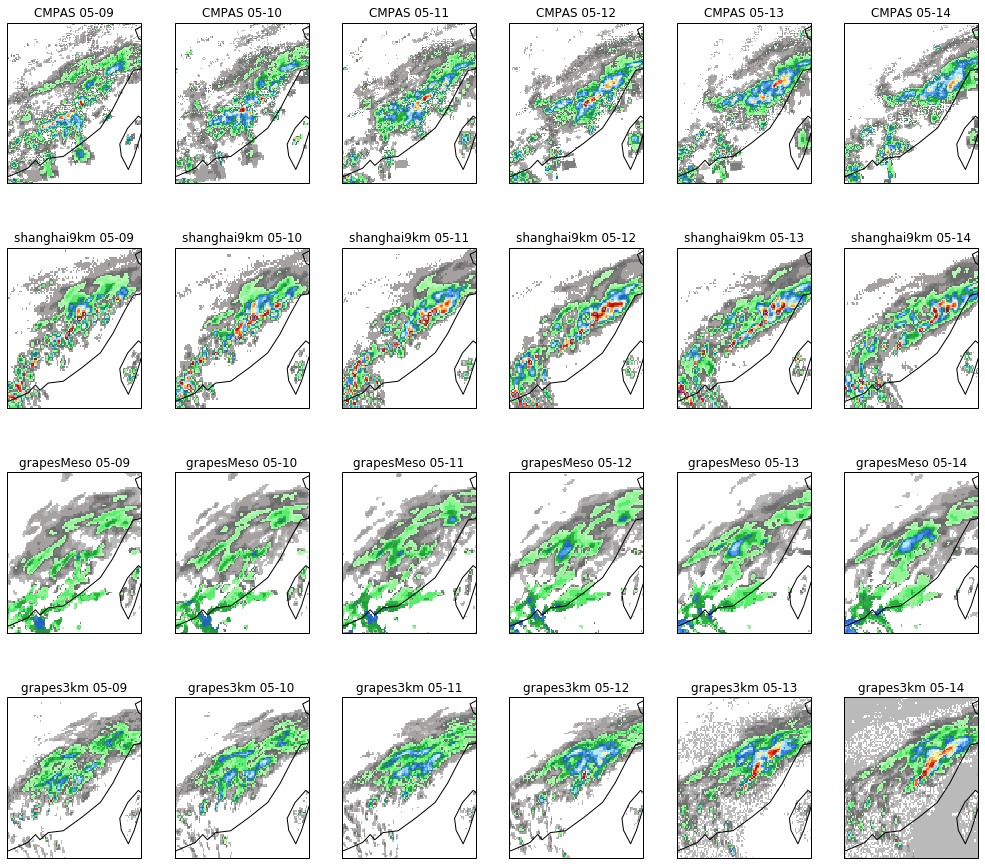

In [11]:
init_time = datetime(2018, 6, 5, 0)
fhours = np.arange(6) + 9
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(116.7, 26.1), width=5)

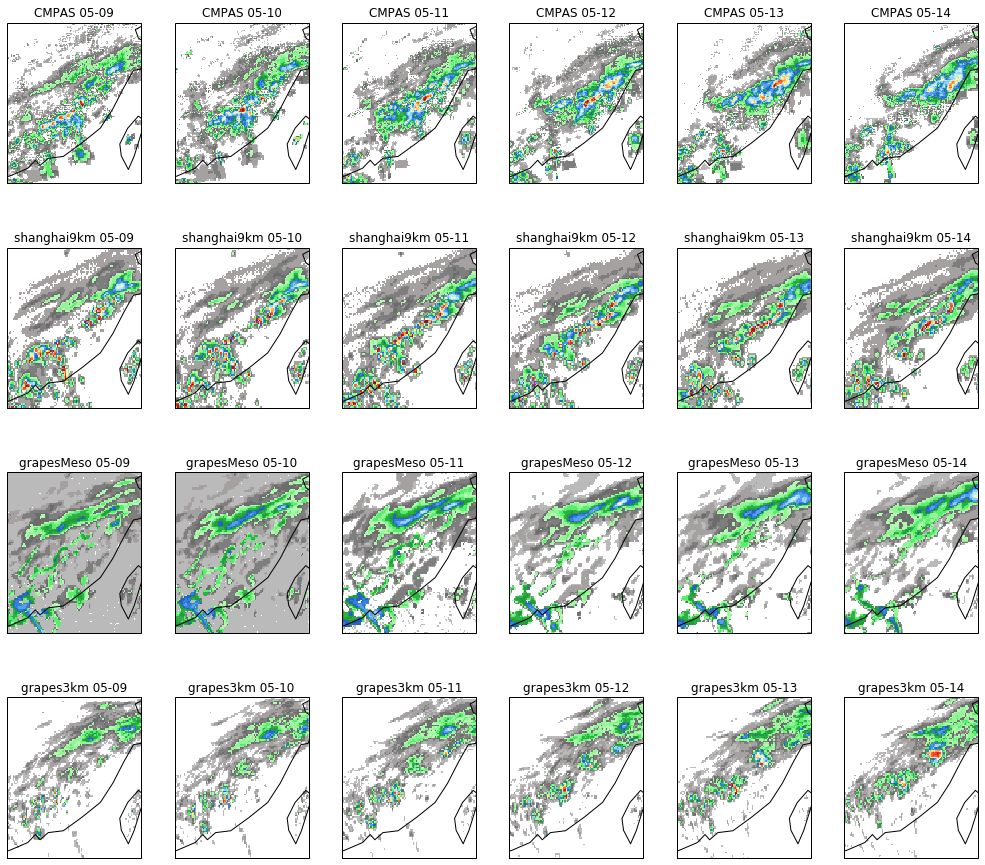

In [12]:
init_time = datetime(2018, 6, 4, 12)
fhours = np.arange(6) + 21
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(116.7, 26.1), width=5)

## 2018年6月7日华南台风艾云尼降水

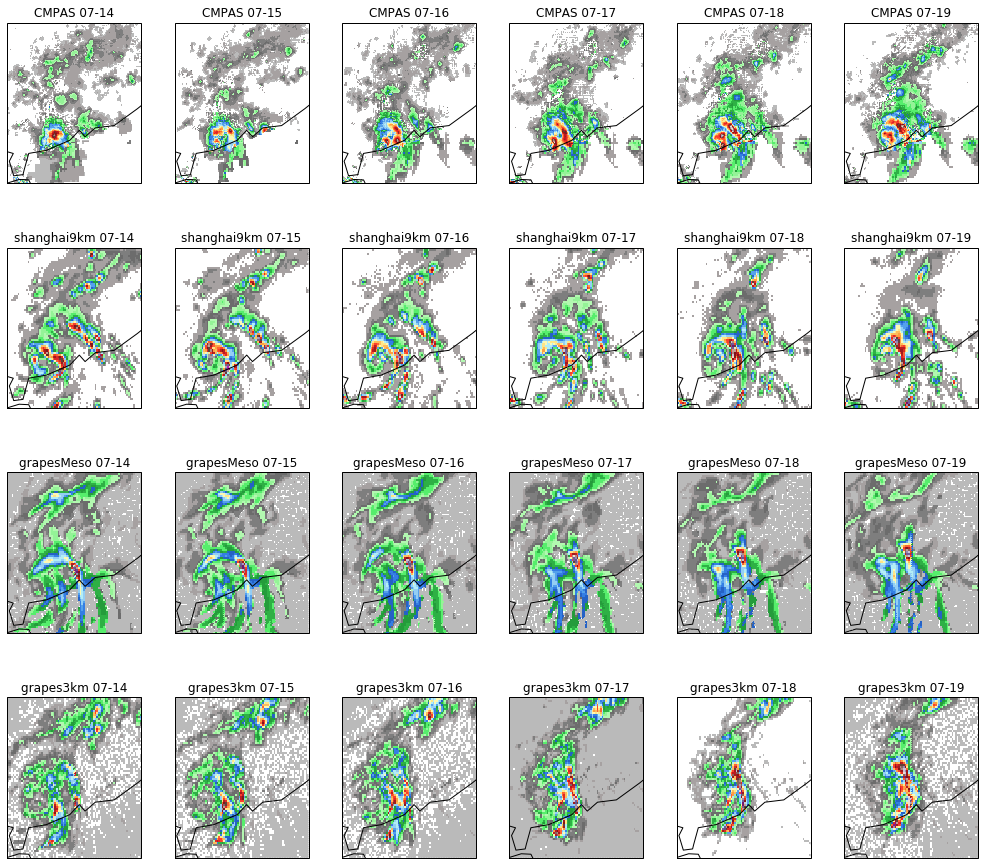

In [13]:
init_time = datetime(2018, 6, 7, 0)
fhours = np.arange(6) + 14
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(113.5, 23.9), width=4)

## 2018年6月17日四川盆地东北部强降水

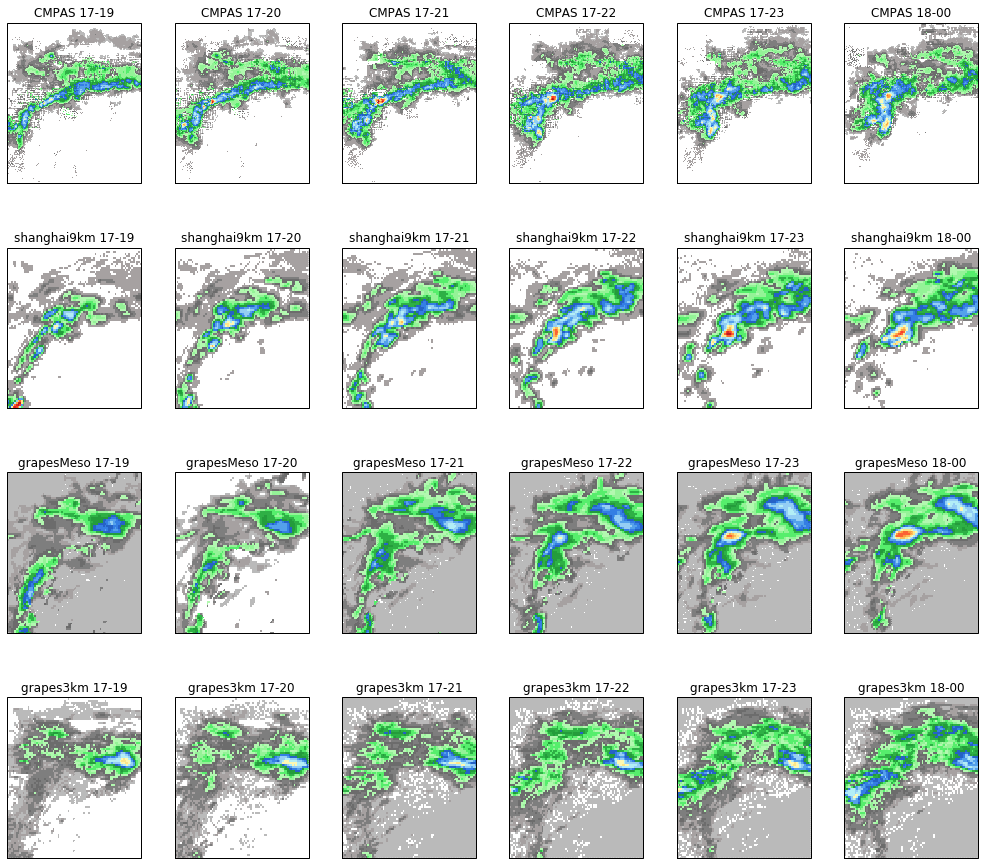

In [14]:
init_time = datetime(2018, 6, 17, 12)
fhours = np.arange(6) + 7
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(109, 32.1), width=4)

## 2018年6月25日山东强降水

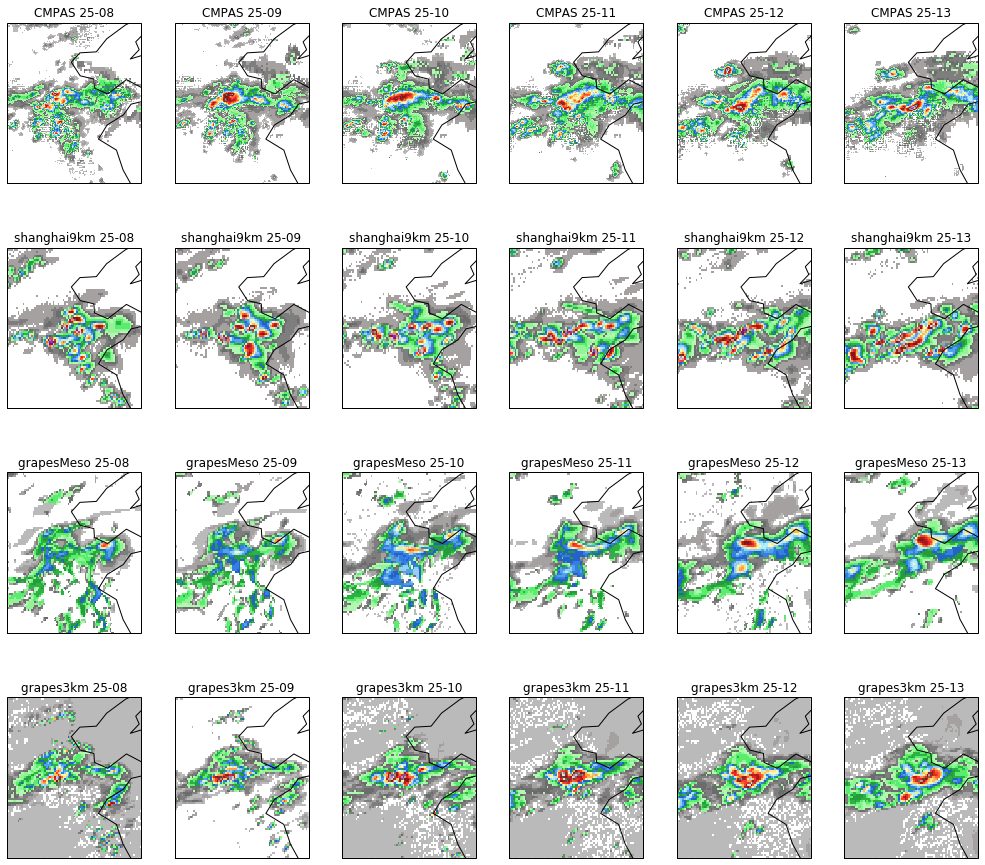

In [15]:
init_time = datetime(2018, 6, 25, 0)
fhours = np.arange(6) + 8
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(117.7, 36.7), width=4)

## 2018年7月1日西北地区强降水过程

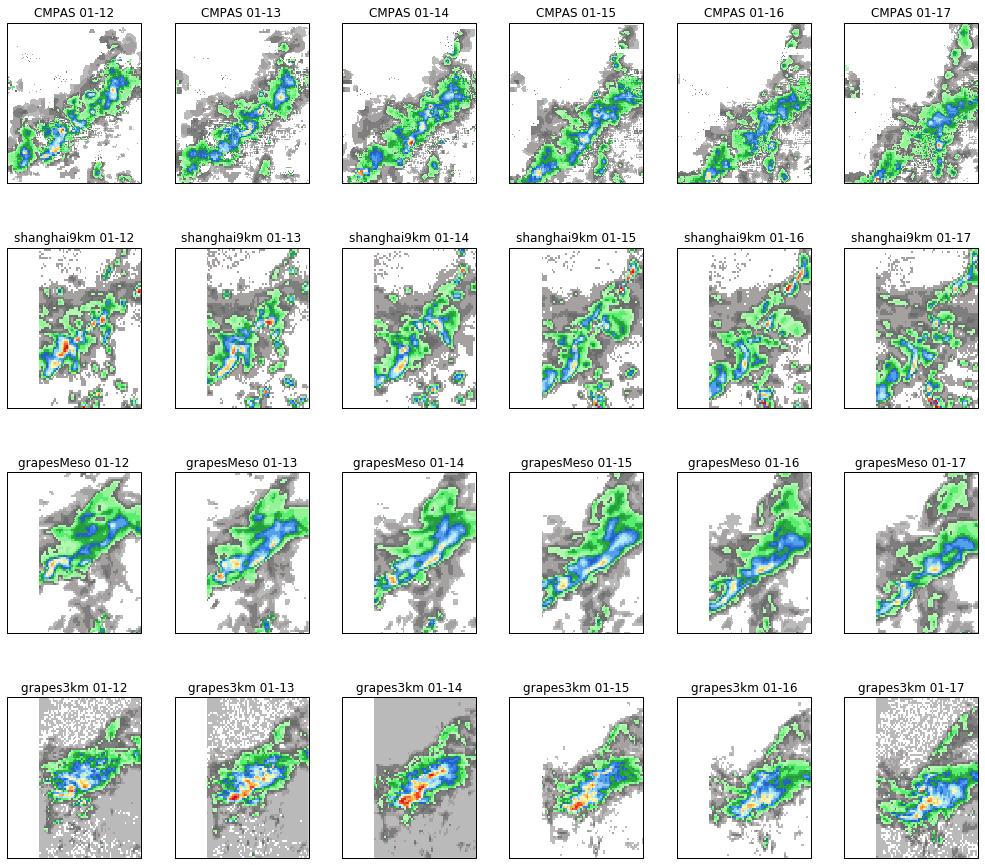

In [16]:
init_time = datetime(2018, 7, 1, 0)
fhours = np.arange(6) + 12
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(104, 36), width=4)

## 2018年7月10日西北地区强降水过程

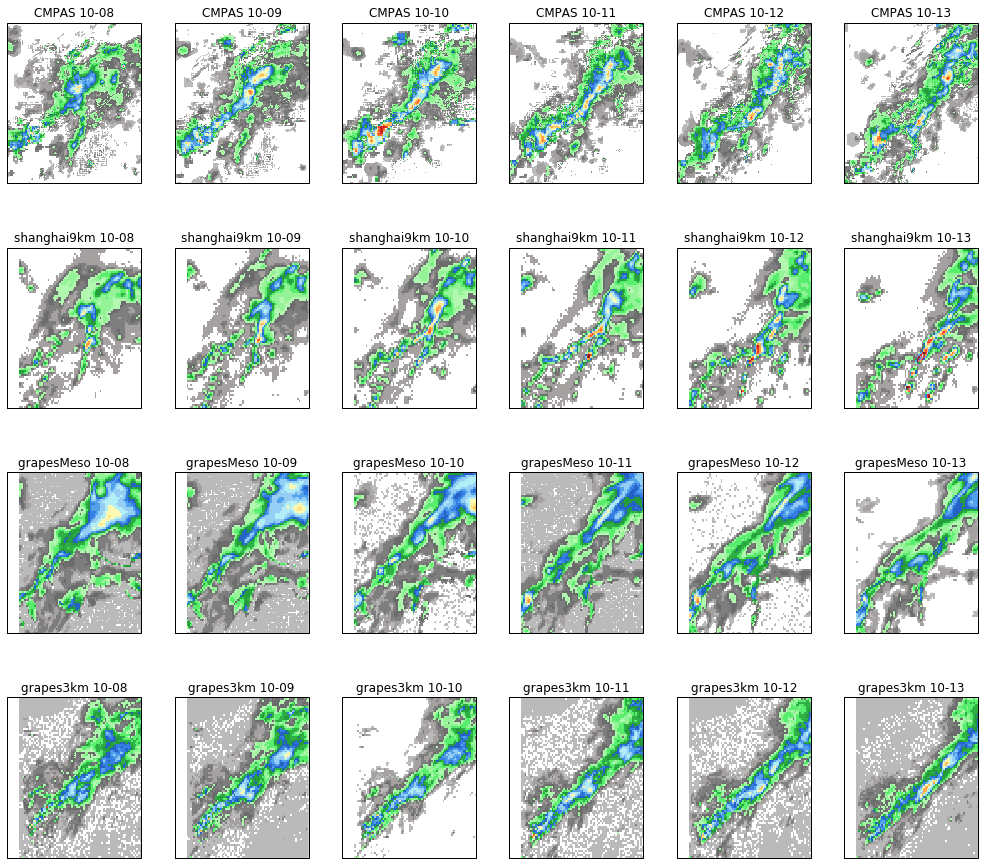

In [17]:
init_time = datetime(2018, 7, 9, 12)
fhours = np.arange(6) + 20
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(105.2, 34.7), width=4)

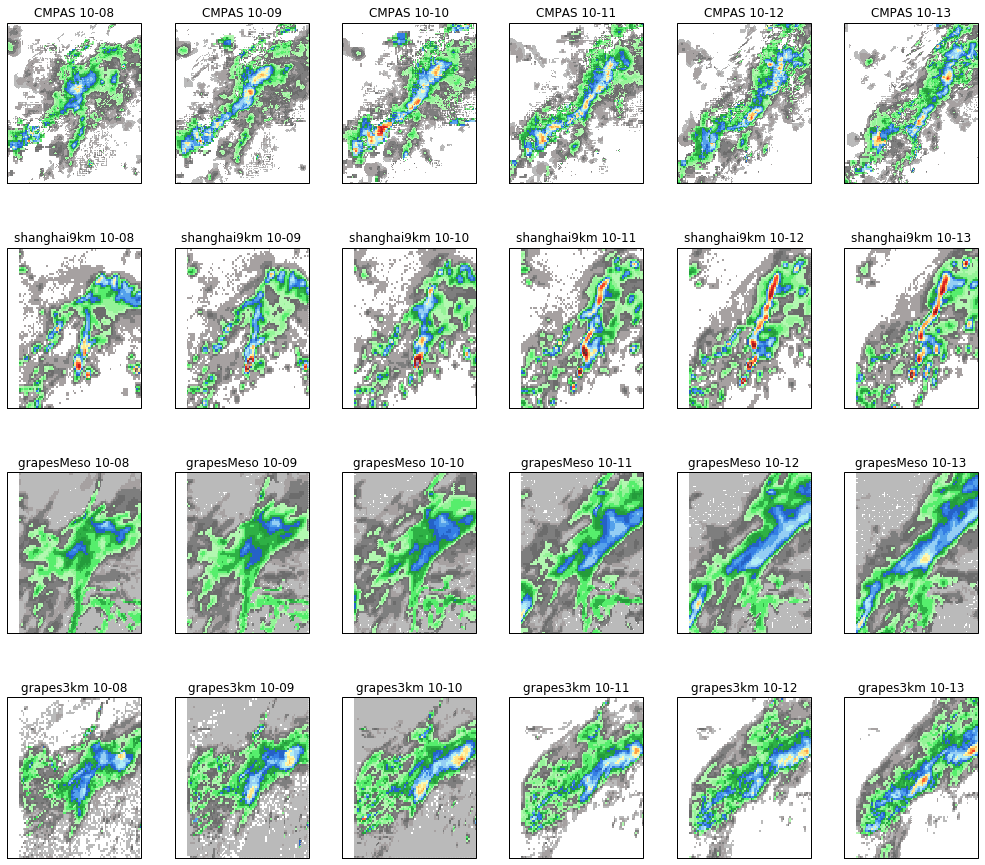

In [18]:
init_time = datetime(2018, 7, 10, 0)
fhours = np.arange(6) + 8
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(105.2, 34.7), width=4)

## 2018年7月10日四川盆地降水

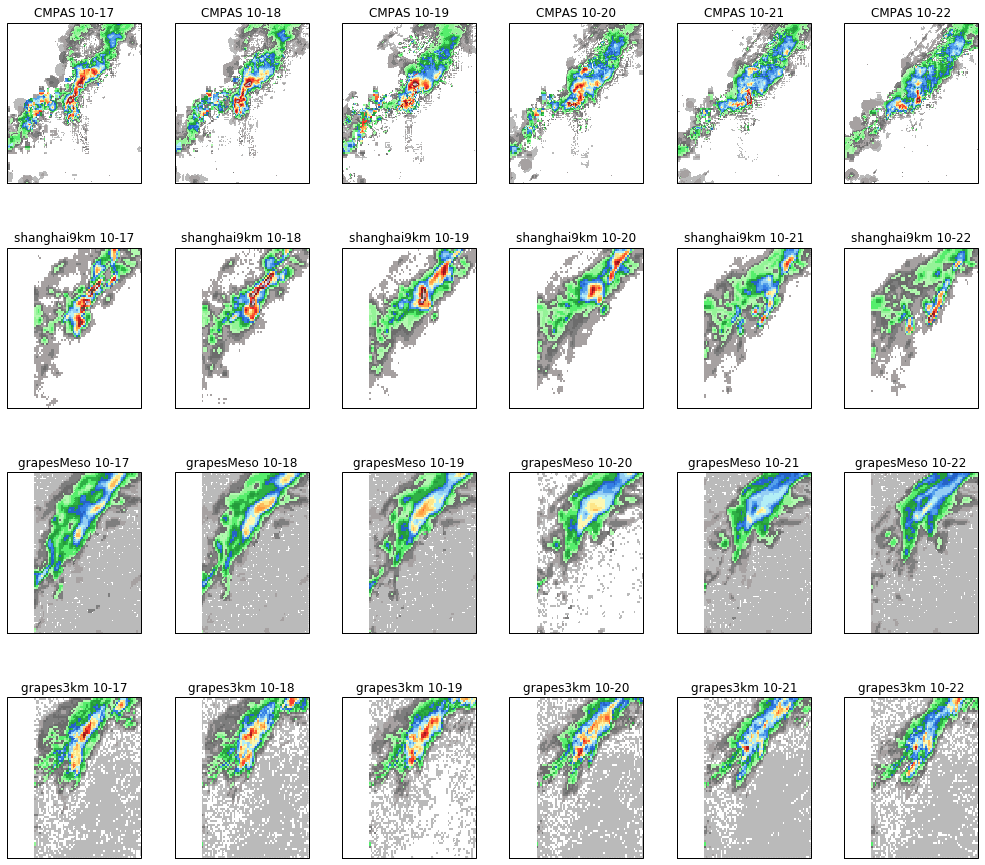

In [19]:
init_time = datetime(2018, 7, 10, 0)
fhours = np.arange(6) + 17
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(104.3, 31.0), width=4)

## 2018年7月11日玛莉亚给江南东部带来降水

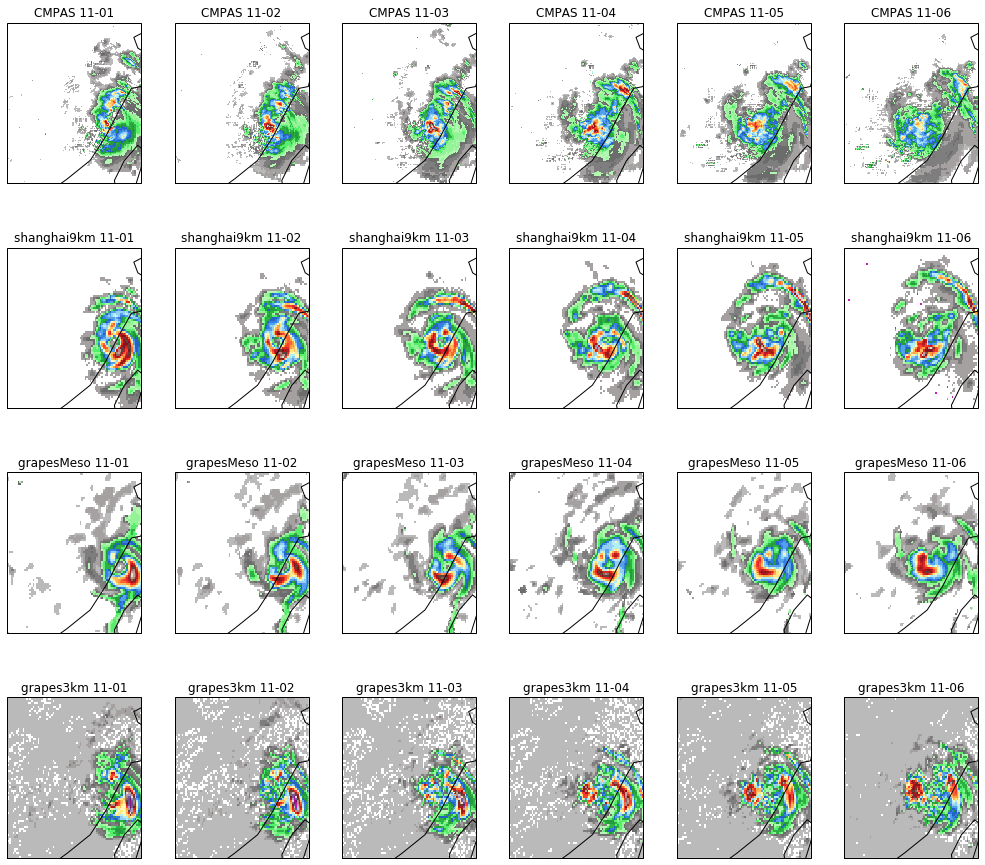

In [20]:
init_time = datetime(2018, 7, 10, 12)
fhours = np.arange(6) + 13
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(117.7, 27.4), width=4)

## 2018年7月10-11日北方降水过程

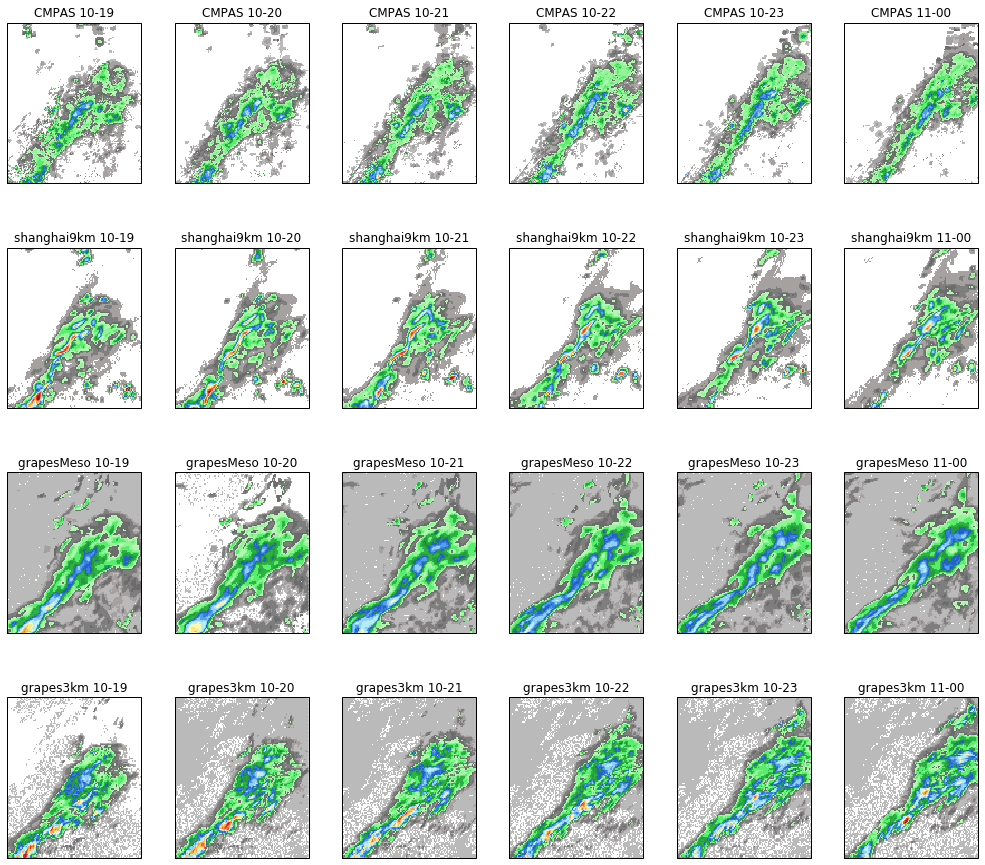

In [21]:
init_time = datetime(2018, 7, 10, 0)
fhours = np.arange(6) + 19
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(109.6, 39.0), width=6)

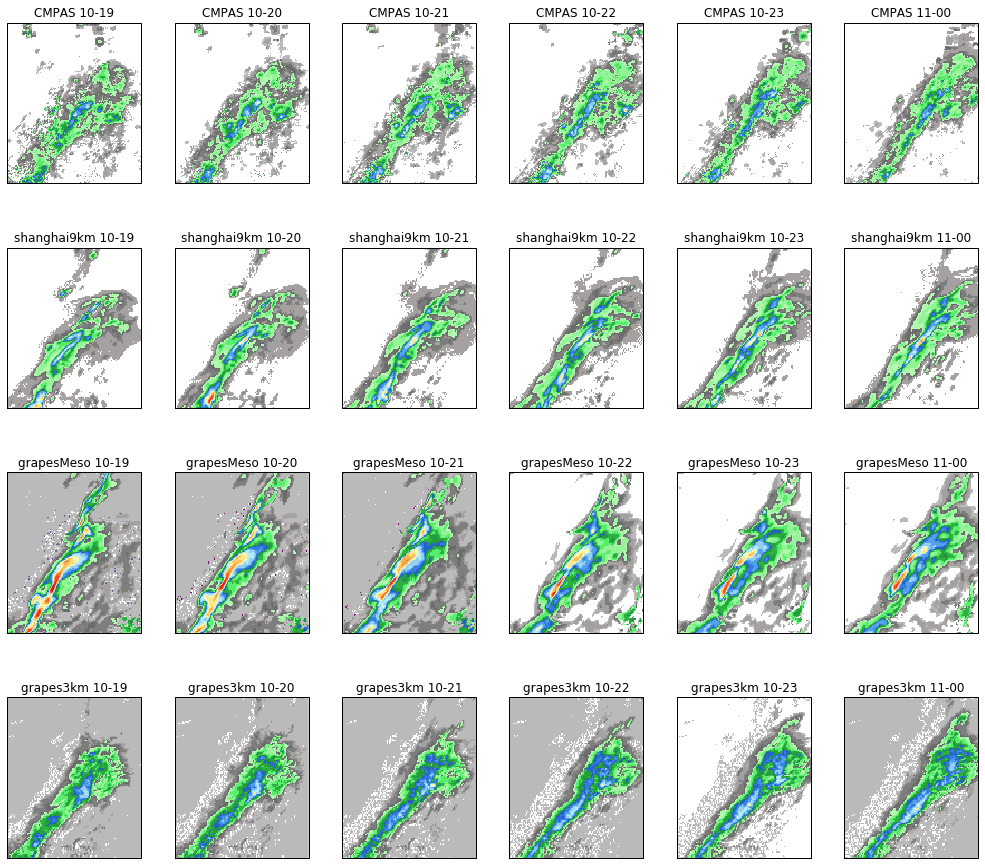

In [22]:
init_time = datetime(2018, 7, 10, 12)
fhours = np.arange(6) + 7
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(109.6, 39.0), width=6)

## 2018年7月14日四川盆地西北部强降水过程

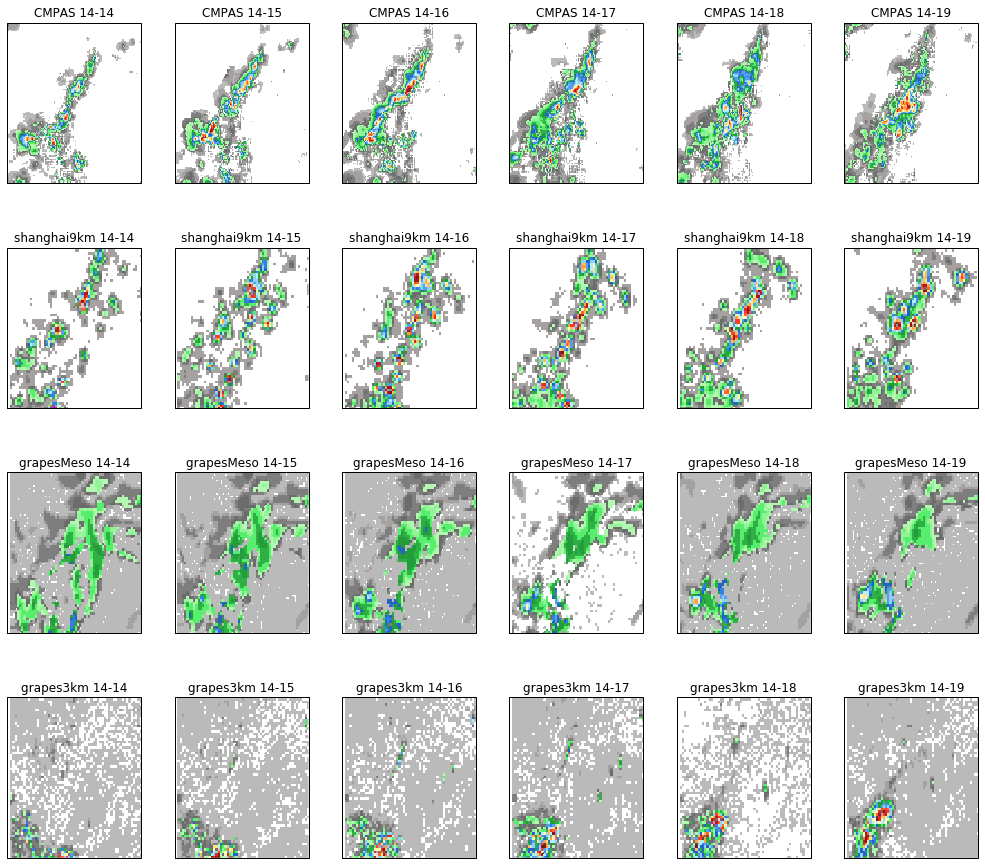

In [23]:
init_time = datetime(2018, 7, 14, 0)
fhours = np.arange(6) + 14
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(104.8, 31.4), width=3)

## 2018年7月15日华北地区强降水过程（预报能力较低）

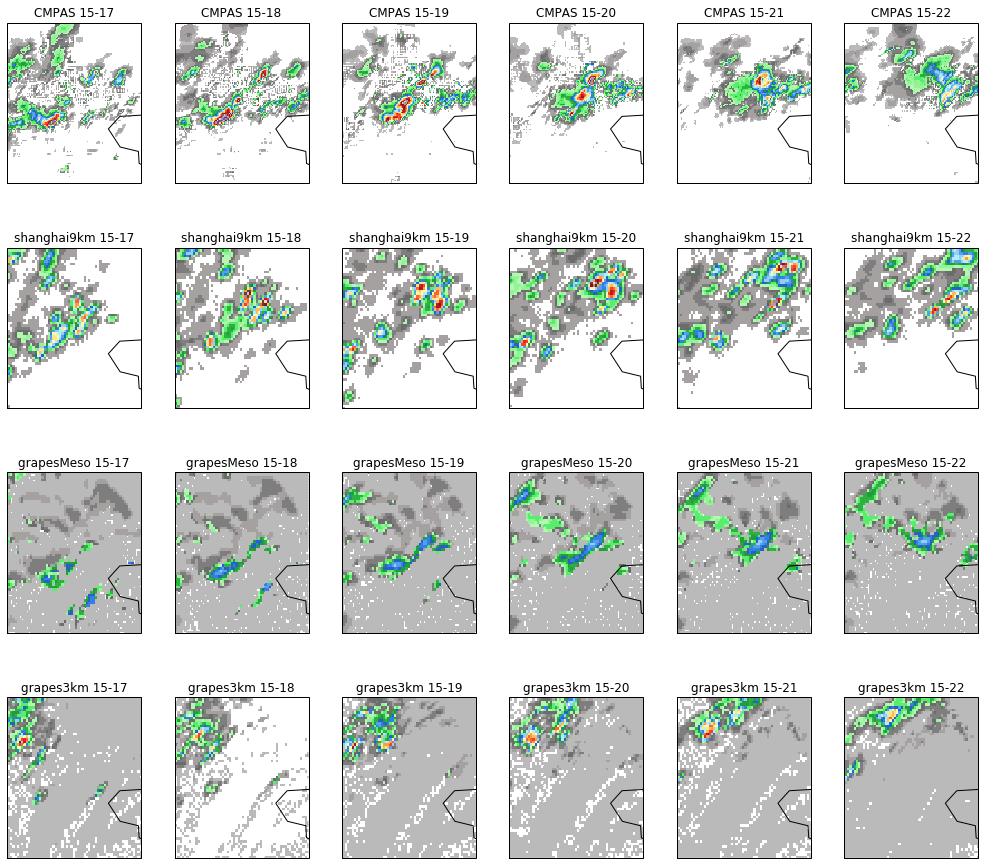

In [24]:
init_time = datetime(2018, 7, 15, 0)
fhours = np.arange(6) + 17
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(116, 39.7), width=3)

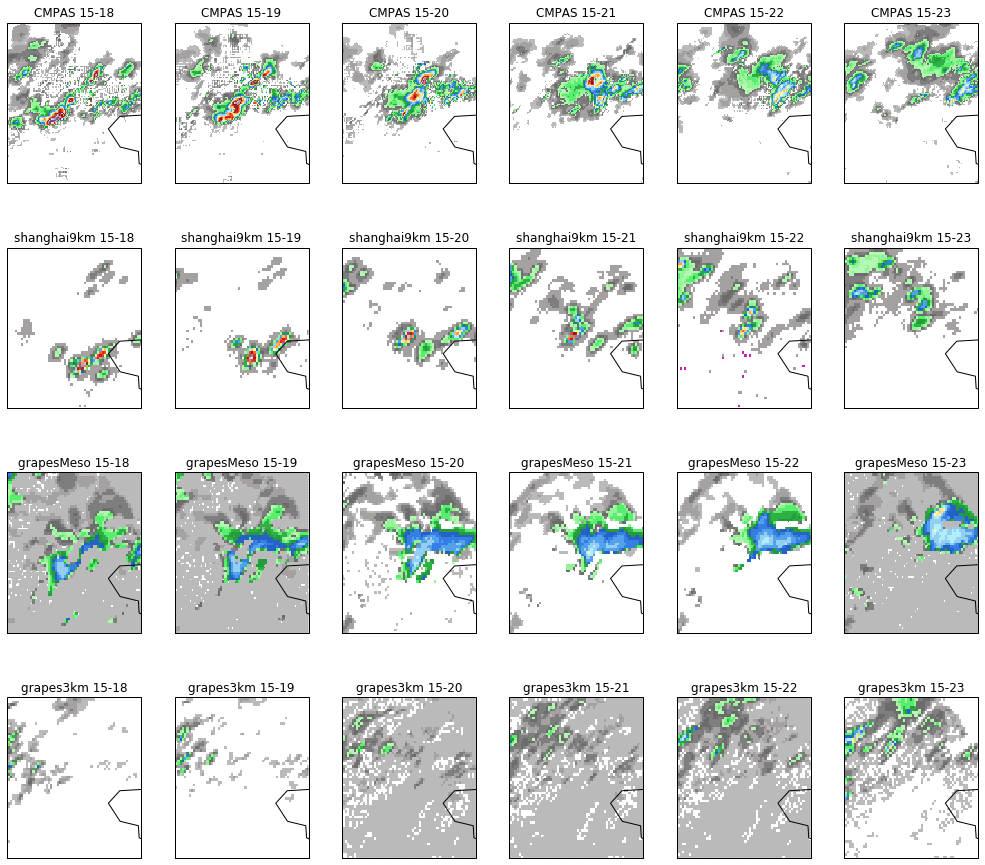

In [25]:
init_time = datetime(2018, 7, 15, 12)
fhours = np.arange(6) + 6
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(116, 39.7), width=3)

## 2018年7月23日台风安比给黄淮、华北带来强降水

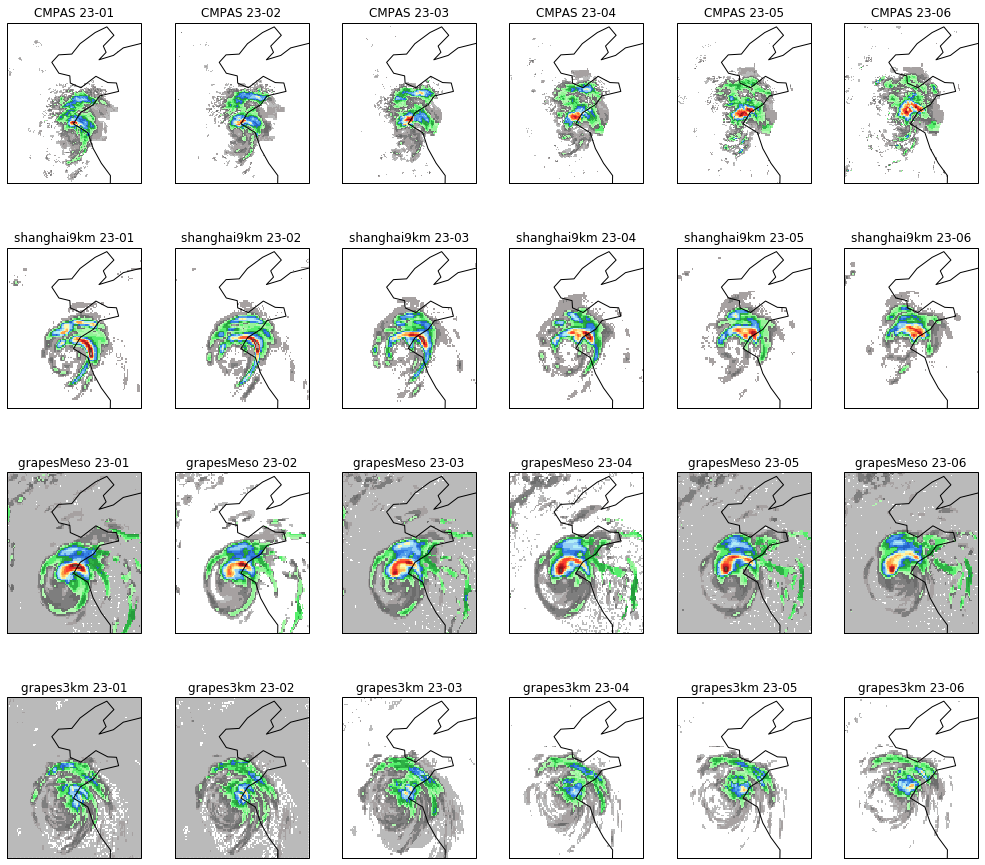

In [26]:
init_time = datetime(2018, 7, 22, 12)
fhours = np.arange(6) + 13
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(119.2, 36.2), width=5)

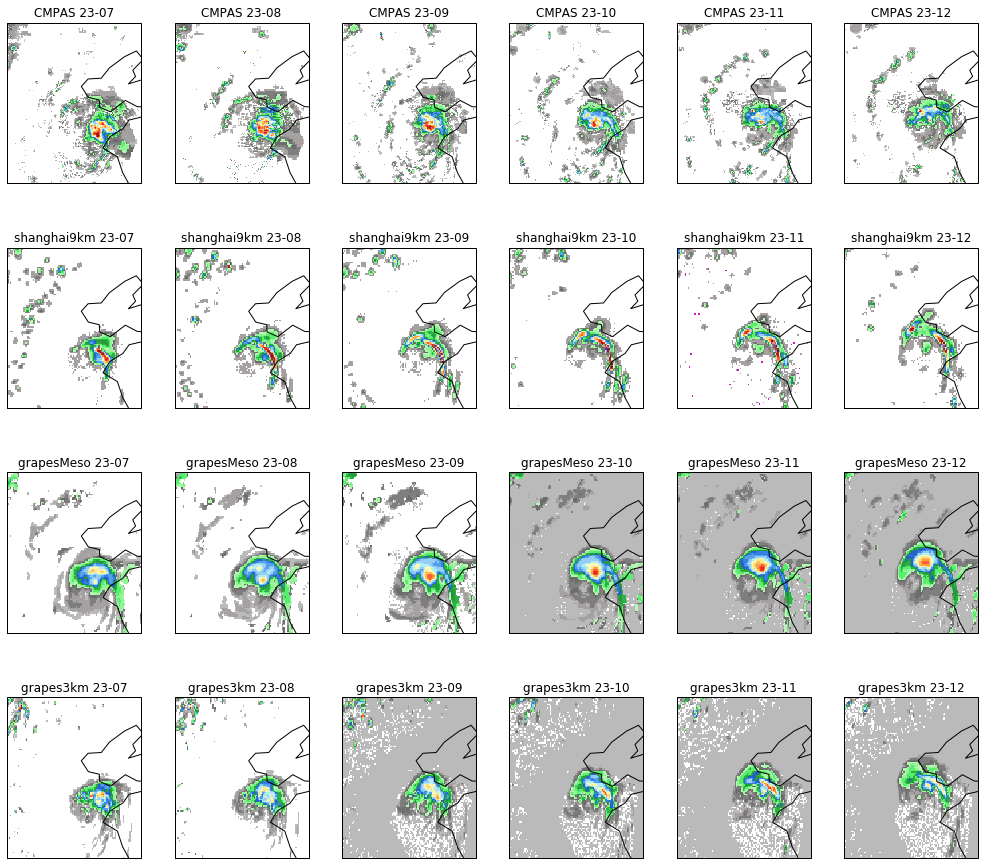

In [27]:
init_time = datetime(2018, 7, 23, 0)
fhours = np.arange(6) + 7
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(117, 37.7), width=5)

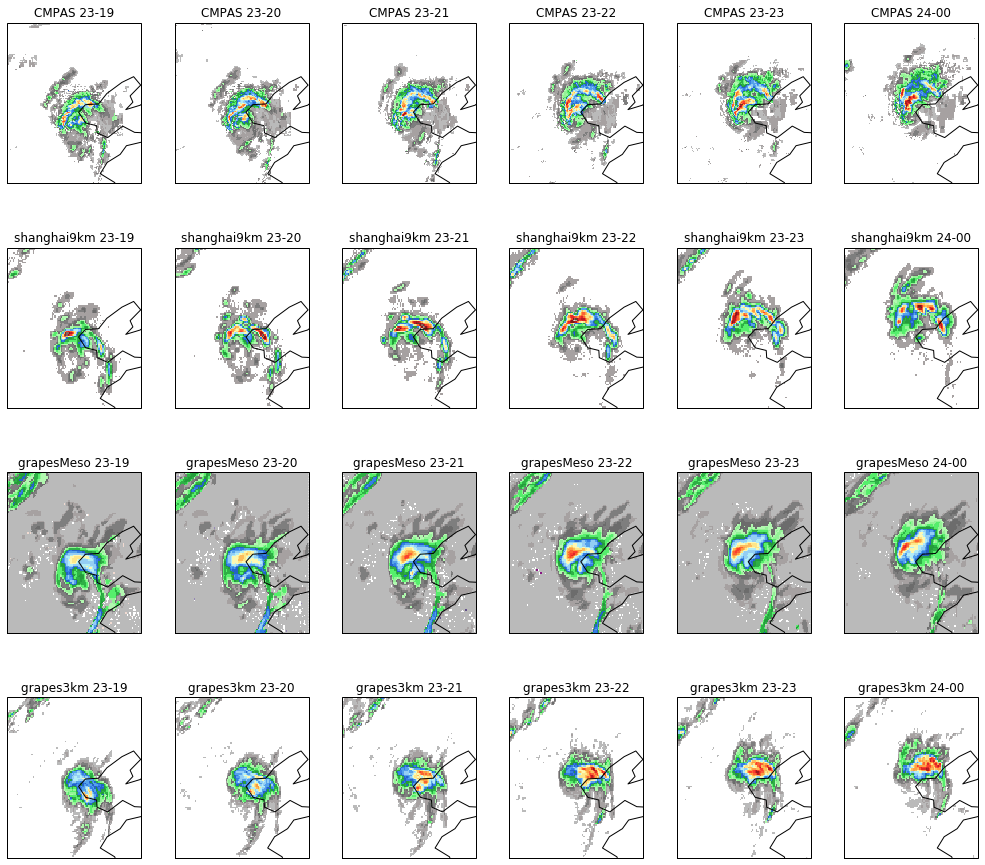

In [28]:
init_time = datetime(2018, 7, 23, 12)
fhours = np.arange(6) + 7
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(117.2, 39.3), width=5)

## 2018年8月2日台风云雀给江浙带来强降水

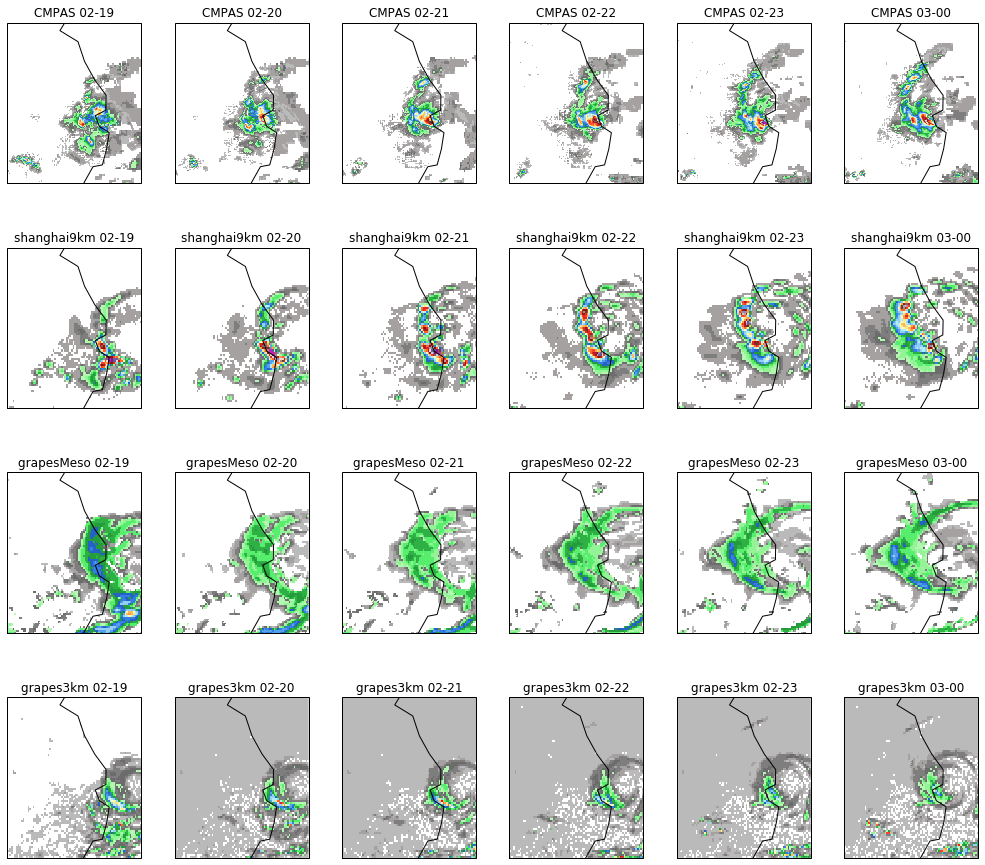

In [29]:
init_time = datetime(2018, 8, 2, 12)
fhours = np.arange(6) + 7
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(120, 31.3), width=4)

## 2018年8月6日辽宁强降水过程

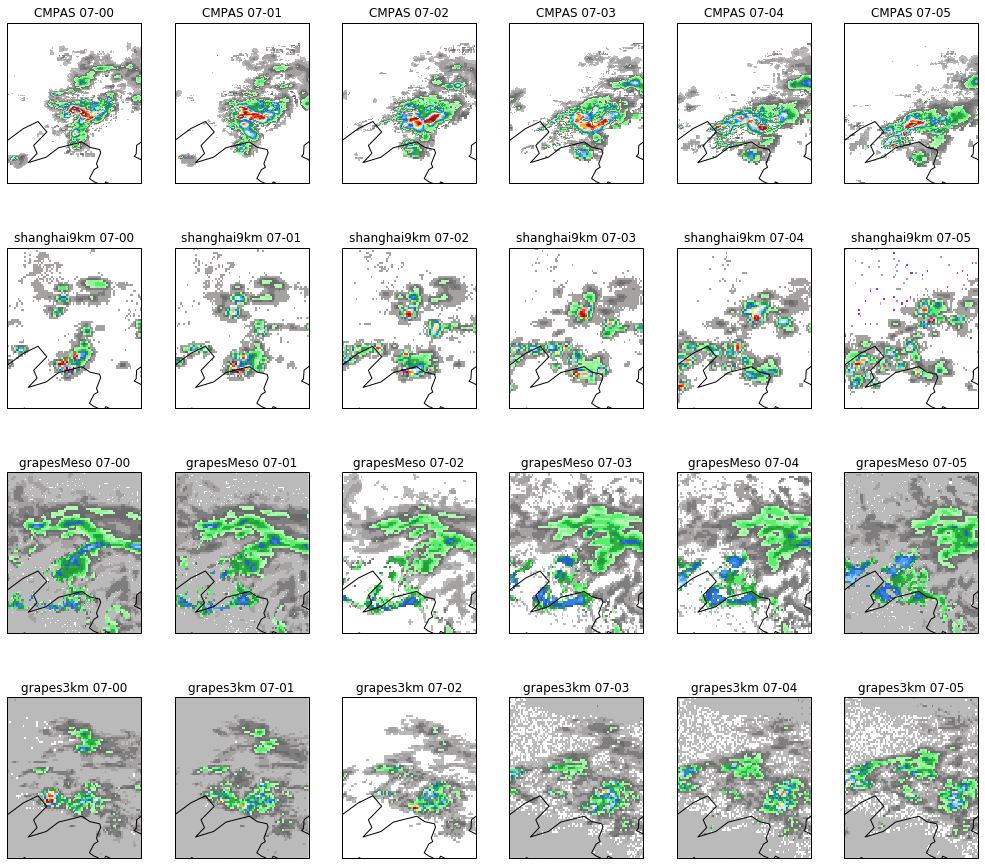

In [30]:
init_time = datetime(2018, 8, 6, 12)
fhours = np.arange(6) + 12
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(123.8, 41.86), width=4)

## 2018年8月8日北京强降水过程

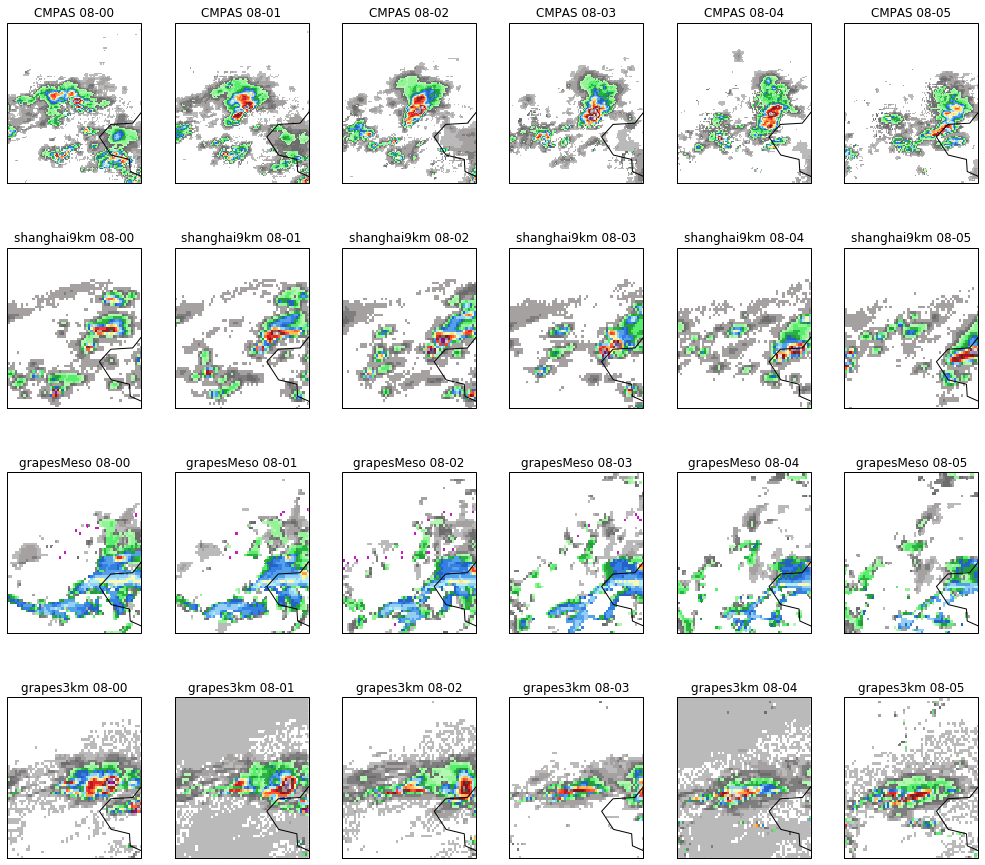

In [31]:
init_time = datetime(2018, 8, 7, 12)
fhours = np.arange(6) + 12
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(116.4, 40), width=3)

## 2018年8月13日台风摩羯强降水过程

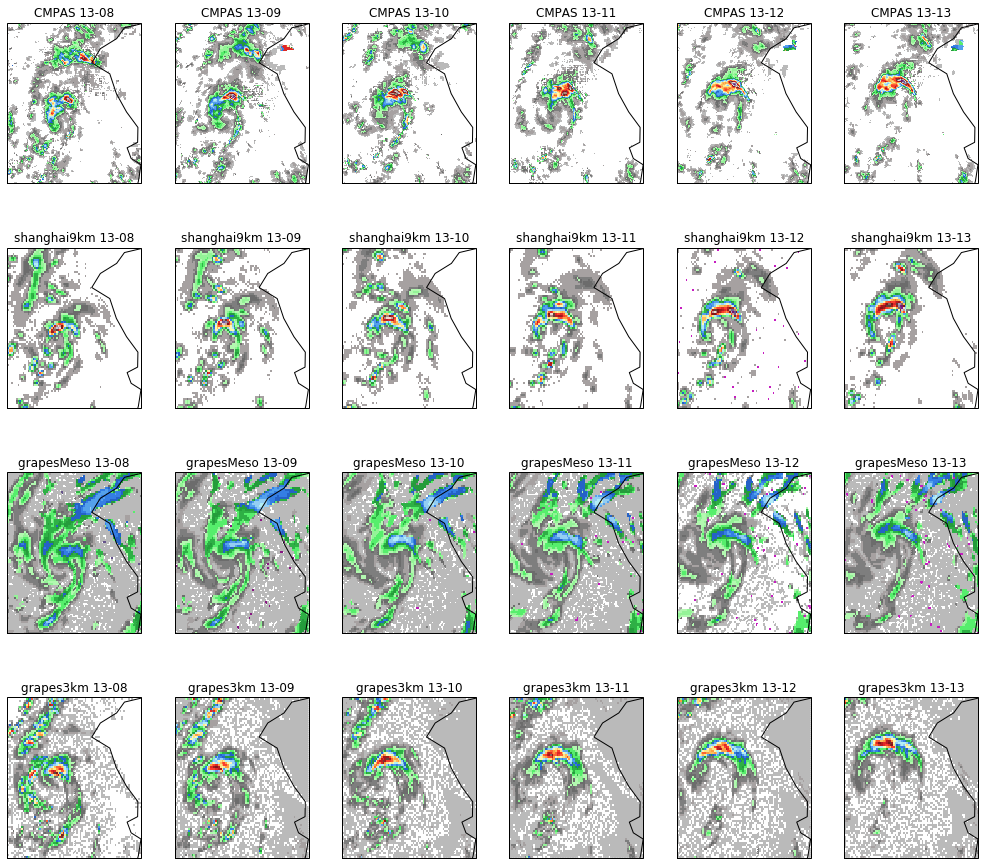

In [32]:
init_time = datetime(2018, 8, 13, 0)
fhours = np.arange(6) + 8
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(118.1, 32.9), width=4)

## 2018年8月17日台风温比亚强降水过程

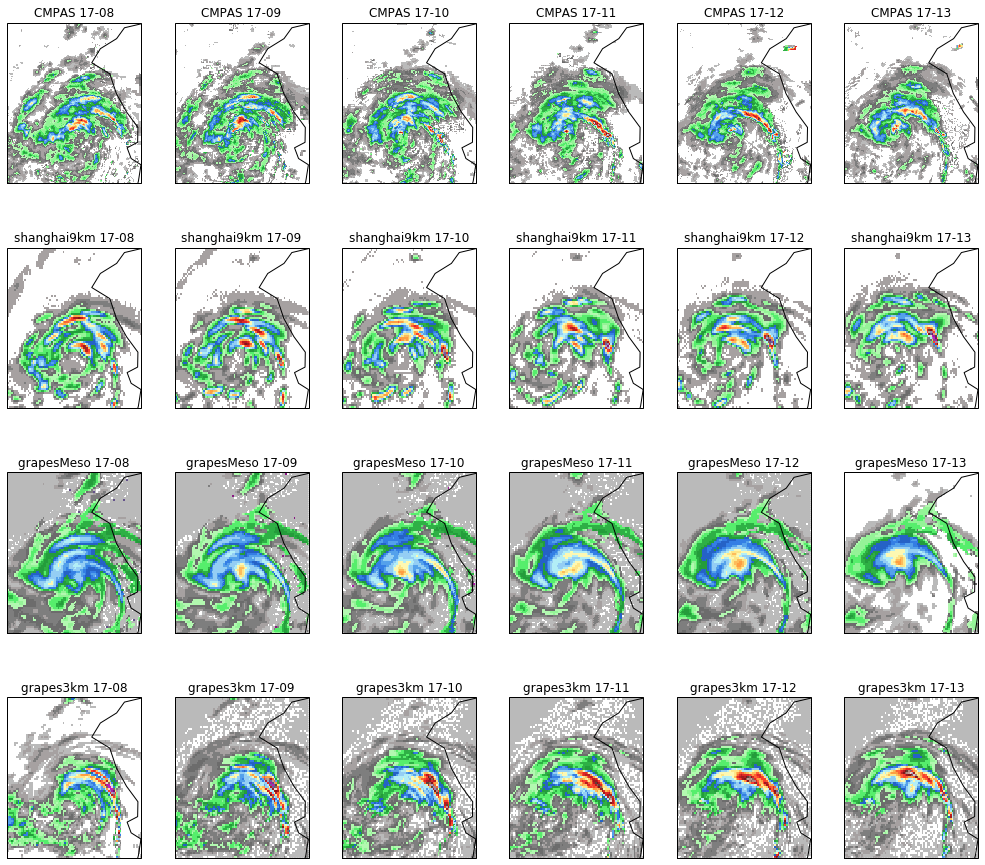

In [33]:
init_time = datetime(2018, 8, 17, 0)
fhours = np.arange(6) + 8
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(118.1, 32.9), width=4)

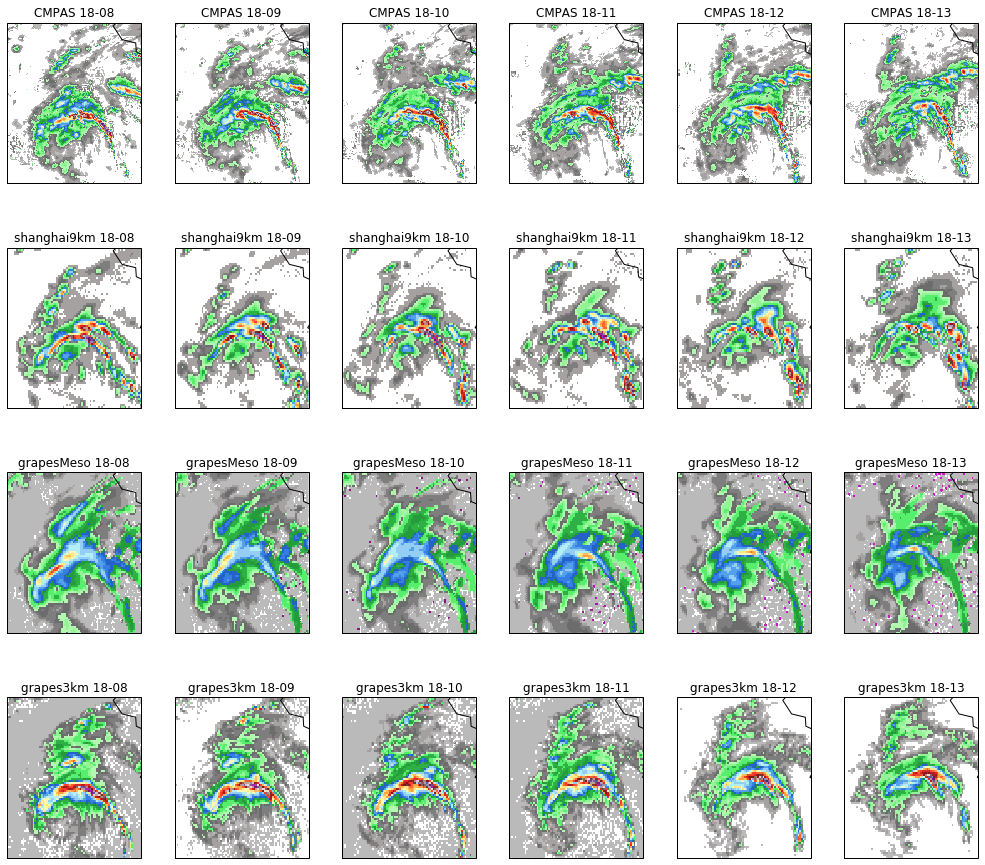

In [34]:
init_time = datetime(2018, 8, 18, 0)
fhours = np.arange(6) + 8
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(115.2, 34.9), width=4)

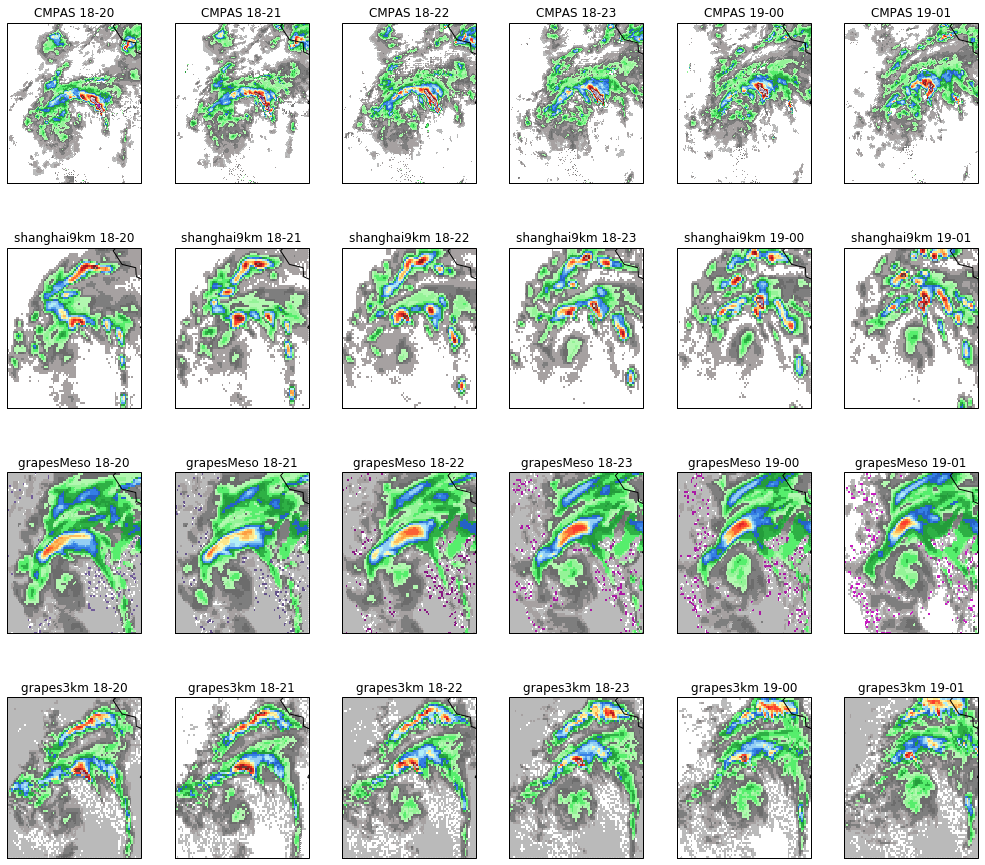

In [35]:
init_time = datetime(2018, 8, 18, 12)
fhours = np.arange(6) + 8
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(115.2, 34.9), width=4)

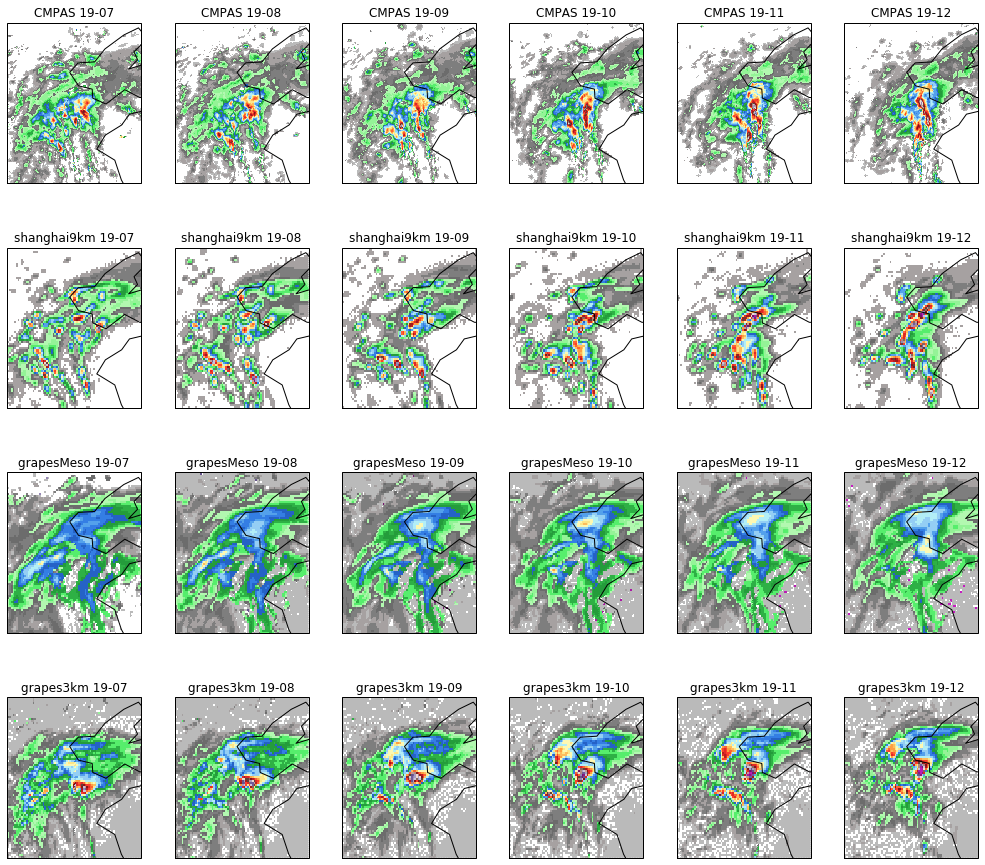

In [36]:
init_time = datetime(2018, 8, 19, 0)
fhours = np.arange(6) + 7
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(117.8, 37.2), width=4)

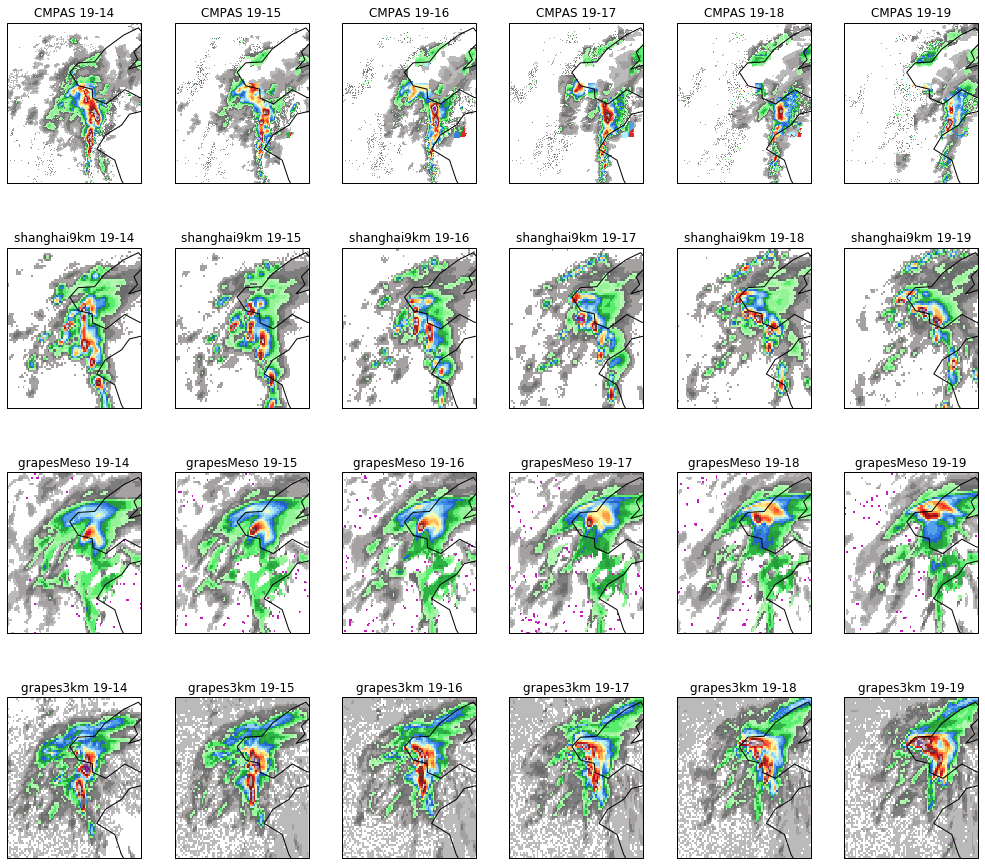

In [37]:
init_time = datetime(2018, 8, 19, 0)
fhours = np.arange(6) + 14
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(117.8, 37.2), width=4)

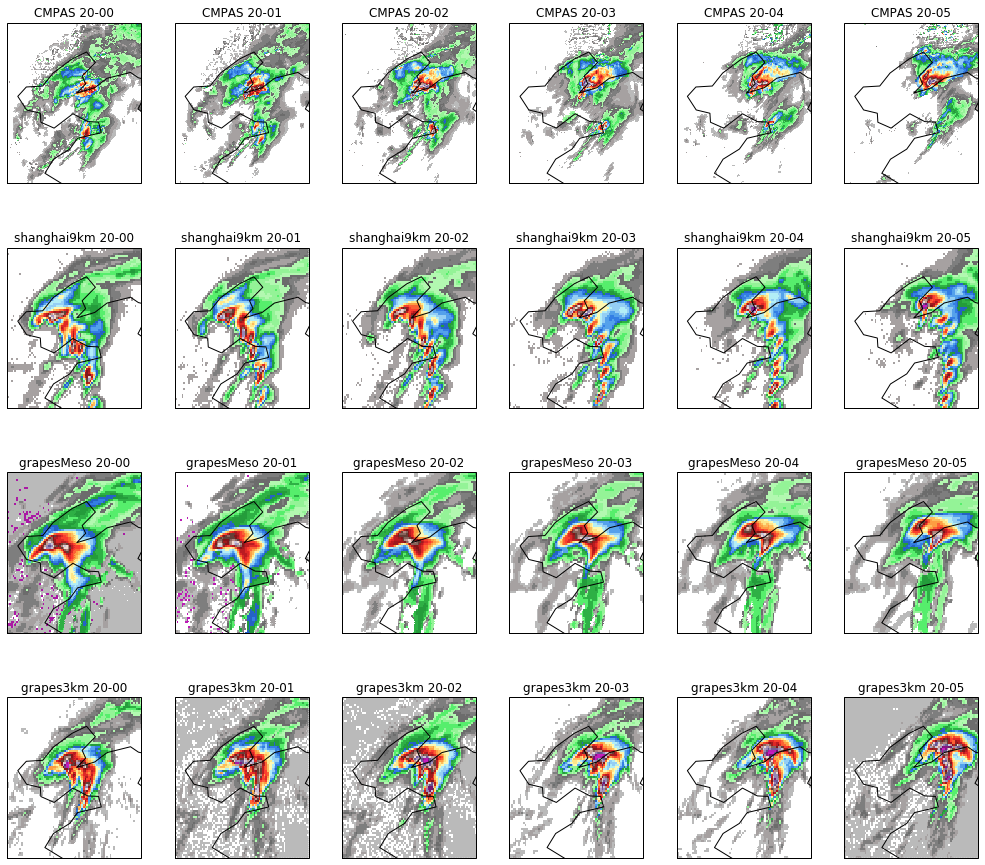

In [38]:
init_time = datetime(2018, 8, 19, 12)
fhours = np.arange(6) + 12
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(120.9, 38.4), width=4)

## 2018年9月16日台风山竹强降水过程

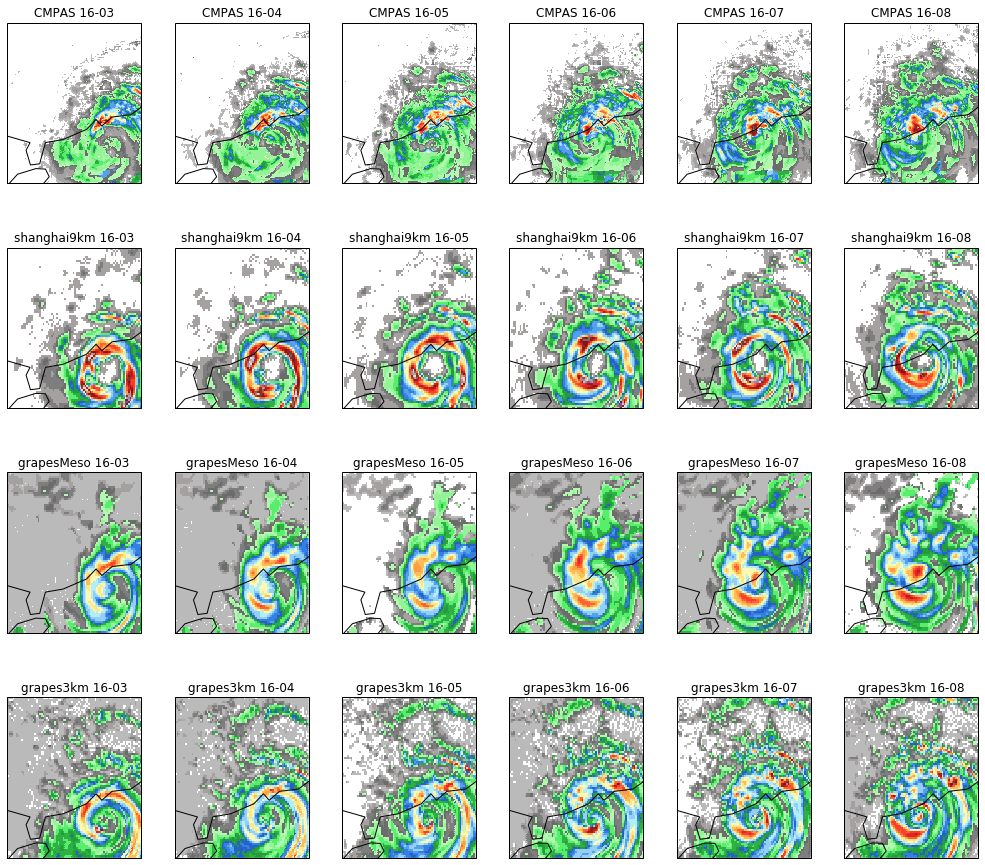

In [39]:
init_time = datetime(2018, 9, 15, 12)
fhours = np.arange(6) + 15
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(112.5, 23.36), width=4)

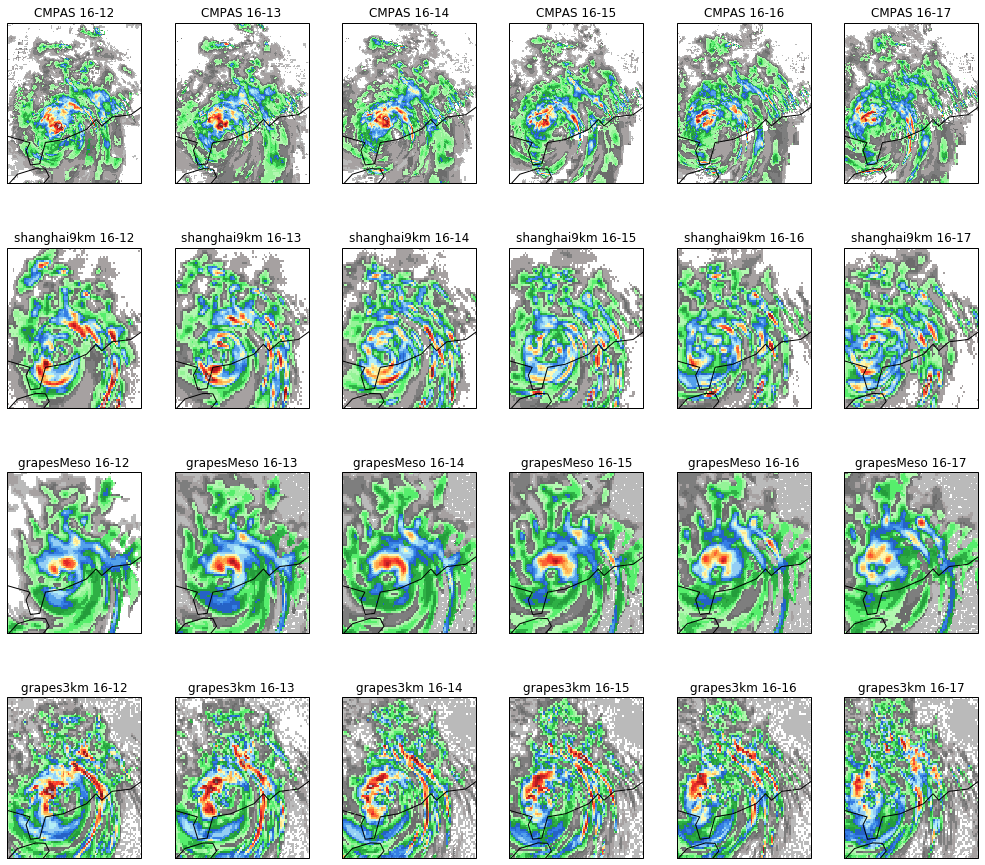

In [40]:
init_time = datetime(2018, 9, 16, 0)
fhours = np.arange(6) + 12
model_evaluation(init_time, fhours, cmpas_dir, data_dir, 
                 models=('shanghai9km', 'grapesMeso', 'grapes3km'),
                 center=(112.5, 23.36), width=4)